**Computer Vision - AAI-521**  
Johnathan Long - Assignment #5: _Object Detection_  
November 25, 2024

[Google Colab](https://colab.research.google.com/drive/1mfR3nDr1iV-TuUrR4CUUX-z9PI4bhl-4?authuser=1#scrollTo=snXW5ky0t2oJ)


In [ ]:
#pip install opencv-python-headless numpy torch requests ipywidgets pillow ultralytics

In [ ]:
# Load Required libraries
import cv2
import numpy as np
import torch
import requests
import ipywidgets as widgets
import matplotlib.pyplot as plt
from IPython.display import display, Javascript
import base64
import time
import threading
from io import BytesIO
from PIL import Image
from ultralytics import YOLO

### **Part 1**  
We will start with reading a video in Python, and apply some basic tools on it. The video chosen
for this part is from pixabay.com, a resource of free video/image and sound clips.

> Read the file “Bangkok.mp4” file using OpenCV. Find the relevant commands to find the video’s metadata and print out the following information about the video: Frame Per second (fps), Total number of frames, Height, and Width of the video.



In [ ]:
#a) Print some information about video
cap = cv2.VideoCapture("Video/Path")

# Retrieve the metadata
video_fps = cap.get(cv2.CAP_PROP_FPS)  # Frames per second
total_frames = cap.get(cv2.CAP_PROP_FRAME_COUNT)  # Total number of frames
height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)  # Height of the frame
width = cap.get(cv2.CAP_PROP_FRAME_WIDTH)  # Width of the frame

# Print the video metadata
print(f"Frame Per second: {video_fps} \nTotal Frames: {int(total_frames)} \nHeight: {int(height)} \nWidth: {int(width)}")

Frame Per second: 25.0 
Total Frames: 650 
Height: 720 
Width: 1280


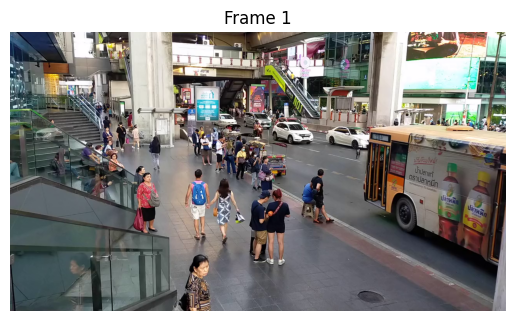

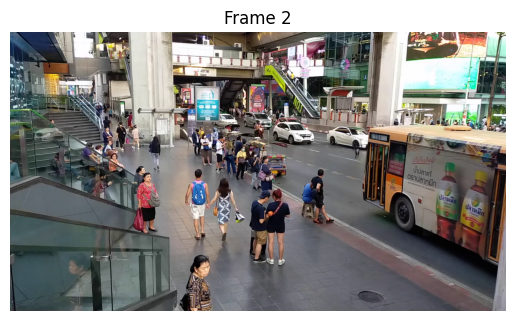

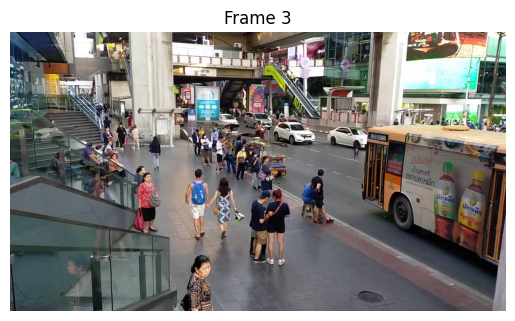

Displayed the first 3 frames.


In [ ]:
video_path = "Video/Path"

# Check if video file or camera opened successfully
if not cap.isOpened():
    print("Error opening video stream or file")
else:
    frame_number = 0
    frames_to_display = 3  # Limit to display only 3 frames

    while True:
        ret, frame = cap.read()
        if ret:
            # Convert frame from BGR to RGB (as OpenCV uses BGR by default)
            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

            # Display the frame using matplotlib
            plt.imshow(frame_rgb)
            plt.axis('off')  # Hide axis
            plt.title(f"Frame {frame_number + 1}")
            plt.show()

            frame_number += 1
            if frame_number >= frames_to_display:  # Stop after displaying 3 frames
                break
        else:
            break

# Release the video capture object
cap.release()
print("Displayed the first 3 frames.")

* _Here I've limited the output to show only three frames to consolidate space_

> There are many ways to play this file inside Google Colab. If you just use OpenCV, it will be shown frame by frame. Another approach is to use an embedded version using HTML library. For the rest of the steps, it would be easier to use HTML version for playing the video.

In [ ]:
#Play the file- method 2
from IPython.display import HTML
from base64 import b64encode
video_path = "Video/Path"

mp4 = open(video_path,'rb').read()
decoded_vid = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f'<video width=400 controls><source src={decoded_vid} type="video/mp4"></video>')

> Let’s apply some filters on the video file. Use adaptive_theshold_mean and threshold_binary_inv, to create a sketch version of the video. You can use the Videowriter command to save the output it takes quite some time. Instead, only print 3 frames of the video.

Frame 1:


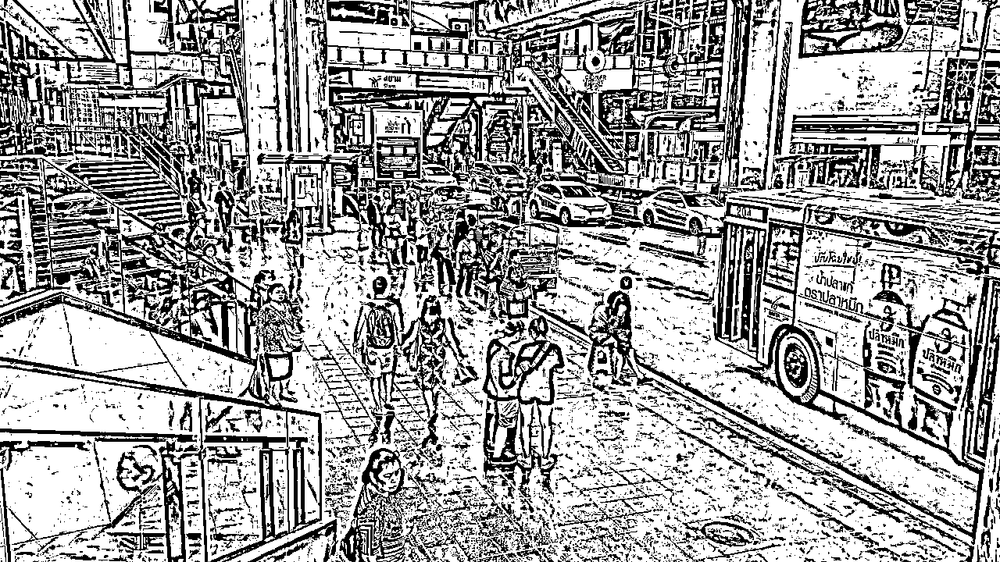

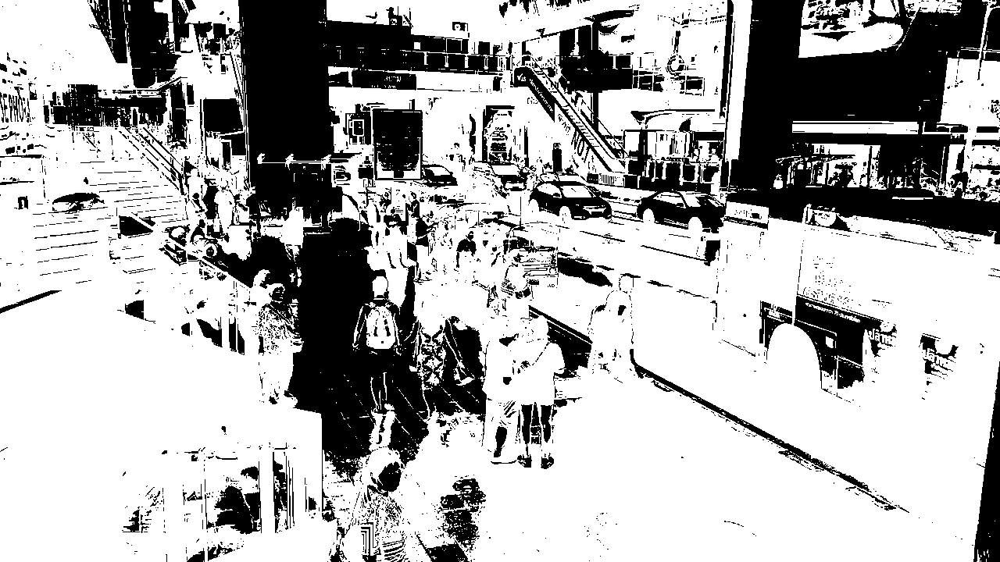

Frame 2:


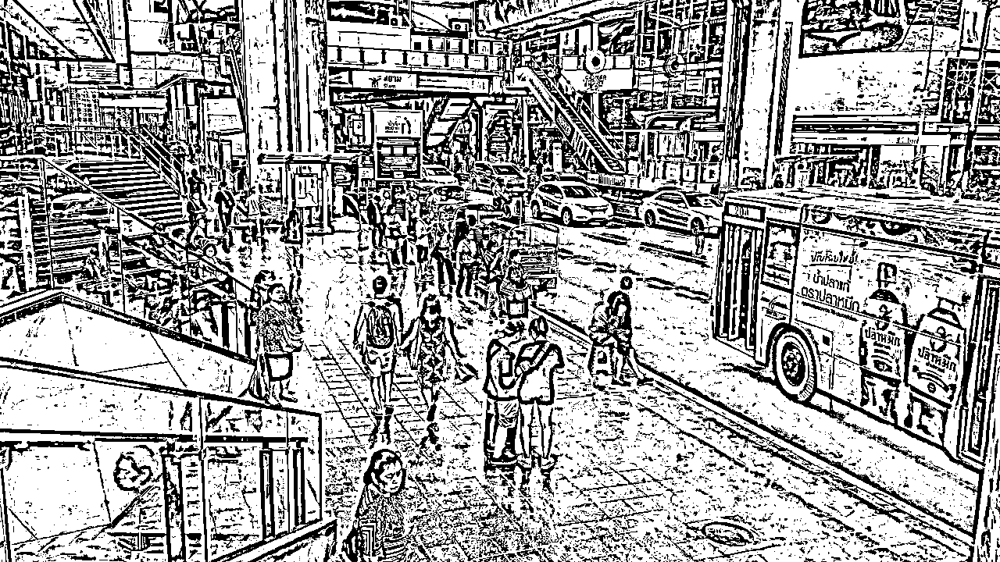

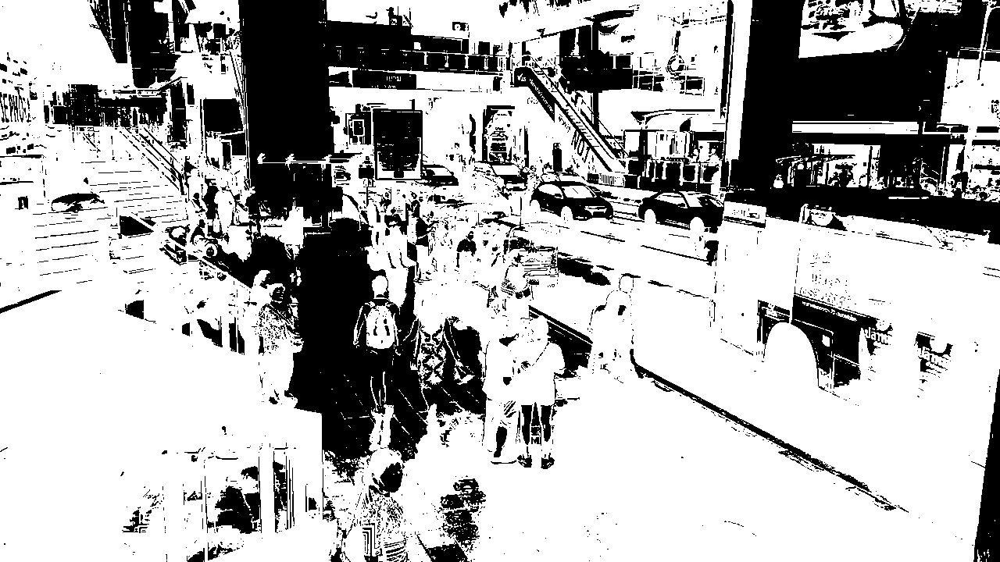

Frame 3:


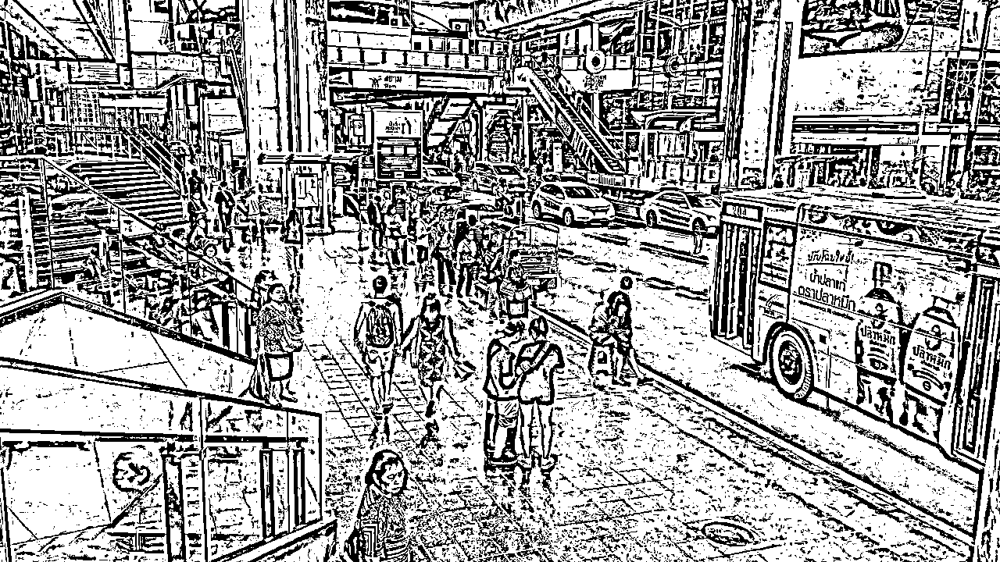

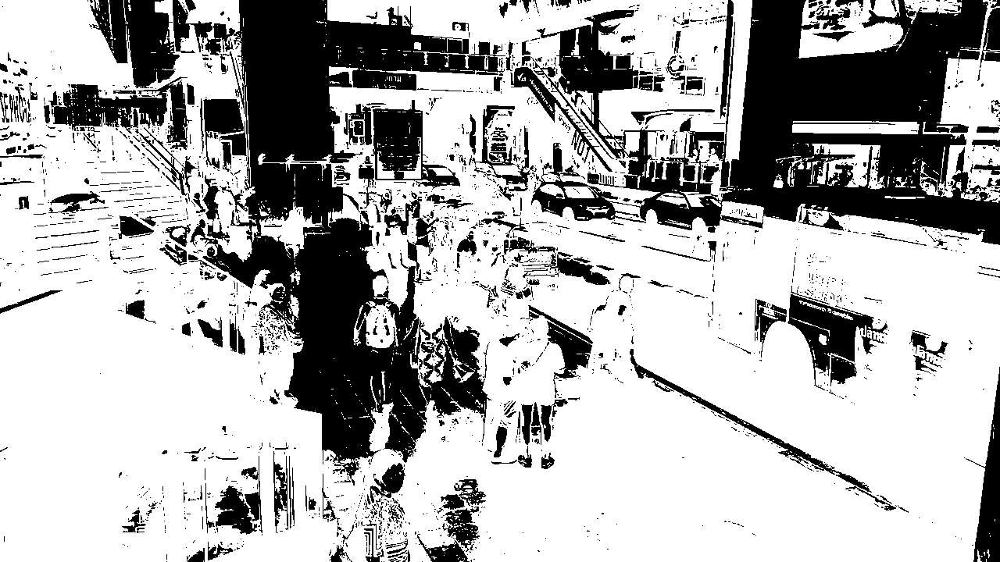

Displayed the first 3 frames.


In [ ]:
import cv2
import numpy as np
from IPython.display import display
from PIL import Image


# Open the video file
cap = cv2.VideoCapture(video_path)

# Process the video frames
frame_count = 0
displayed_frames = 0  # Counter to display only 3 frames

while cap.isOpened():
    ret, frame = cap.read()
    if not ret or displayed_frames >= 3:
        break

    # Convert frame to grayscale
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Apply adaptive thresholding (mean) for sketch effect
    sketch_frame = cv2.adaptiveThreshold(
        gray_frame, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2
    )

    # Apply binary inverse thresholding
    _, sketch_frame_inv = cv2.threshold(
        gray_frame, 127, 255, cv2.THRESH_BINARY_INV
    )

    # Convert the NumPy array frames to PIL images for inline display
    sketch_image = Image.fromarray(sketch_frame)
    binary_inv_image = Image.fromarray(sketch_frame_inv)

    # Clear previous output and display the current frame
    print(f"Frame {frame_count + 1}:")
    display(sketch_image)  # Display the sketch frame
    display(binary_inv_image)  # Display the binary inverse frame

    # Update counters
    frame_count += 1
    displayed_frames += 1

# Release the video capture object
cap.release()
print("Displayed the first 3 frames.")

### **Part 2 - Pose Estimation in Video**  
Return to the functions that were provided in previous assignments to estimate the pose in images. This time, we want to experience it in a video file. For that, we will follow the approach in https://github.com/tensorflow/hub/tree/master/examples and estimate the pose of the girl in
video. The format of the video this time is gif.

In [ ]:
# Step 2: Load pre-trained YOLOv8 model
#model = YOLO('yolov8n.pt')

In [ ]:
# Step 3: Function to detect objects using YOLOv8
def detect_objects(frame):
    results = model(frame)
    annotated_frame = results[0].plot()
    return annotated_frame

In [ ]:
import cv2

cap = cv2.VideoCapture(0)
if not cap.isOpened():
    print("Error: Unable to access the webcam.")
else:
    ret, frame = cap.read()
    if ret:
        print("Webcam is working.")
    else:
        print("Failed to capture frame.")
cap.release()


Webcam is working.


### **Part 3- Using Webcam Video**  
Now, we want to use a webcam and make object detection in real time. As you have seen in previous modules, the first step is to have a pre-trained model and use it for future classifications. My recommendation is to use the YOLO8 modell for this part (yolov8n.pt). Another piece that we need is a script to connect our webcam to Python to make a live object detection application. We will be using the code snippet for Camera Capture which runs JavaScript code to utilize your computer's webcam. Please refer to the previous assignment to copy the code here. Use a code to detect the camera and take a photo, and finally detect the objects in the photo

Image(value=b'', format='jpeg', height='480', width='640')

Button(description='Stop Video and Display Snapshot', style=ButtonStyle())


0: 480x640 1 person, 1 chair, 1 couch, 1 bed, 1 tv, 35.0ms
Speed: 1.0ms preprocess, 35.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 1 chair, 1 bed, 1 tv, 4.0ms
Speed: 2.0ms preprocess, 4.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 1 chair, 1 couch, 1 tv, 5.0ms
Speed: 1.0ms preprocess, 5.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 1 chair, 1 bed, 1 tv, 5.0ms
Speed: 1.0ms preprocess, 5.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 1 chair, 1 couch, 1 tv, 4.0ms
Speed: 1.0ms preprocess, 4.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 1 chair, 2 tvs, 5.0ms
Speed: 1.0ms preprocess, 5.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 1 chair, 1 couch, 2 tvs, 5.0ms
Speed: 1.0ms preprocess, 5.0ms inference, 1.0ms postprocess pe

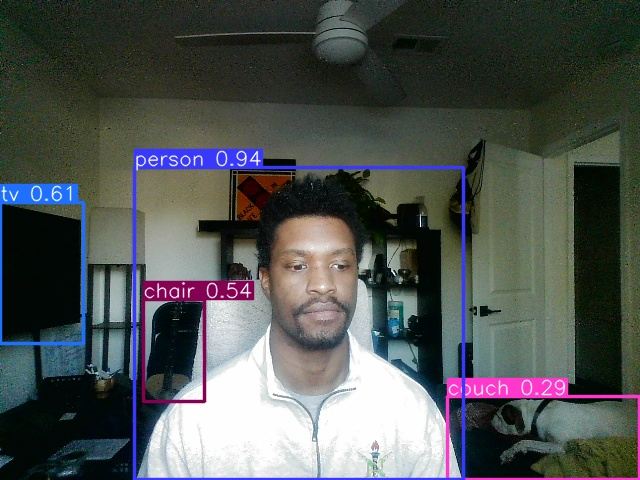

In [ ]:
import cv2
import threading
import time
import numpy as np
from IPython.display import display, Image
import ipywidgets as widgets
from ultralytics import YOLO

# Load the YOLOv8 model
model = YOLO('yolov8n.pt')

# Create an Image widget for displaying the video
image_widget = widgets.Image(format='jpeg', width=640, height=480)
display(image_widget)

# Flag to control the video loop
stop_video = False

# Path to save the snapshots
snapshot_path = "annotated_frame.jpeg"

def detect_and_display():
    global stop_video
    cap = cv2.VideoCapture(0)  # Open webcam (0 is the default camera)

    if not cap.isOpened():
        print("Error: Unable to access the webcam.")
        return

    while not stop_video:
        ret, frame = cap.read()
        if not ret:
            print("Failed to capture frame.")
            break

        # Convert frame to RGB (YOLO expects RGB format)
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        # Detect objects using YOLOv8
        results = model(frame_rgb)
        annotated_frame = results[0].plot()  # Annotate the frame

        # Save the annotated frame to disk
        cv2.imwrite(snapshot_path, cv2.cvtColor(annotated_frame, cv2.COLOR_RGB2BGR))

        # Update the widget with the new frame
        _, buffer = cv2.imencode('.jpeg', cv2.cvtColor(annotated_frame, cv2.COLOR_RGB2BGR))
        image_widget.value = buffer.tobytes()

        time.sleep(0.03)  # Add a small delay to control frame rate

    cap.release()

# Start video processing in a separate thread
thread = threading.Thread(target=detect_and_display)
thread.start()

# Create a button to stop the video and display the saved snapshot
stop_button = widgets.Button(description="Stop Video and Display Snapshot")
display(stop_button)

def stop_video_callback(_):
    global stop_video
    stop_video = True
    print("Stopping video...")

    # Display the saved snapshot as a static image
    display(Image(snapshot_path))

stop_button.on_click(stop_video_callback)



_Extra credit: Instead of taking photos, design a code that can detect the objects in real-time
while you are seeing the video on Notebook._
